## To get the code working on your industries change the array in cell 7

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.types import StringType
import pyspark.sql.functions as F
import pandas as pd

spark = SparkSession.builder.appName("MyApp").getOrCreate()

JOBS_PATH = "../../dbfs/FileStore/shared_uploads/majedbishara@campus.technion.ac.il/job_postings_clean.csv"

meta_industries_12 = {
    'Furniture and Home Furnishings Manufacturing': 'Manufacturing',
    'Investment Banking': 'Financial and Investment',
    'Architecture and Planning': 'Services',
    'Wholesale': 'Services',
    'Travel Arrangements': 'Services',
    'Ranching': 'Miscellaneous',
    'Hospitals and Health Care': 'Healthcare and Medical',
    'Book and Periodical Publishing': 'Services',
    'Printing Services': 'Services',
    'Professional Training and Coaching': 'Services',
    'Computers and Electronics Manufacturing': 'Manufacturing',
    'Shipbuilding': 'Manufacturing',
    'Public Policy Offices': 'Government and Public Policy',
    'Software Development': 'Technology',
    'Outsourcing and Offshoring Consulting': 'Services',
    'Retail Groceries': 'Retail and Consumer Goods',
    'Education Administration Programs': 'Education and Training',
    'Plastics Manufacturing': 'Manufacturing',
    'Renewable Energy Semiconductor Manufacturing': 'Manufacturing',
    'Computer Networking Products': 'Technology',
    'Events Services': 'Services',
    'Information Services': 'Services',
    'Food and Beverage Services': 'Services',
    'Semiconductor Manufacturing': 'Manufacturing',
    'Business Consulting and Services': 'Services',
    'Insurance': 'Services',
    'Financial Services': 'Services',
    'Wireless Services': 'Services',
    'Computer Hardware Manufacturing': 'Technology',
    'Public Safety': 'Services',
    'Maritime Transportation': 'Transportation and Logistics',
    'Tobacco Manufacturing': 'Manufacturing',
    'Writing and Editing': 'Services',
    'Veterinary Services': 'Services',
    'Staffing and Recruiting': 'Services',
    'Accounting': 'Services',
    'International Affairs': 'Government and Public Policy',
    'Spectator Sports': 'Miscellaneous',
    'Glass, Ceramics and Concrete Manufacturing': 'Manufacturing',
    'Chemical Manufacturing': 'Manufacturing',
    'Mining': 'Miscellaneous',
    'E-Learning Providers': 'Technology',
    'Security and Investigations': 'Services',
    'Translation and Localization': 'Services',
    'Automation Machinery Manufacturing': 'Technology',
    'Computer and Network Security': 'Technology',
    'Political Organizations': 'Government and Public Policy',
    'Environmental Services': 'Government and Public Policy',
    'Oil and Gas': 'Miscellaneous',
    'Real Estate': 'Real Estate and Construction',
    'Think Tanks': 'Government and Public Policy',
    'Executive Offices': 'Miscellaneous',
    'Law Practice': 'Services',
    'Nanotechnology Research': 'Miscellaneous',
    'International Trade and Development': 'Government and Public Policy',
    'Personal Care Product Manufacturing': 'Manufacturing',
    'Philanthropic Fundraising Services': 'Services',
    'Entertainment Providers': 'Media and Entertainment',
    'Market Research': 'Media and Entertainment',
    'Movies, Videos, and Sound': 'Media and Entertainment',
    'Sporting Goods Manufacturing': 'Manufacturing',
    'Graphic Design': 'Services',
    'Technology, Information and Internet': 'Technology',
    'IT Services and IT Consulting': 'Technology',
    'Retail Office Equipment': 'Retail and Consumer Goods',
    'Wholesale Import and Export': 'Services',
    'Capital Markets': 'Financial and Investment',
    'Law Enforcement': 'Services',
    'Freight and Package Transportation': 'Transportation and Logistics',
    'Industrial Machinery Manufacturing': 'Manufacturing',
    'Non-profit Organizations': 'Miscellaneous',
    'Retail Art Supplies': 'Retail and Consumer Goods',
    'Animation and Post-production': 'Media and Entertainment',
    'Transportation, Logistics, Supply Chain and Storage': 'Transportation and Logistics',
    'Aviation and Aerospace Component Manufacturing': 'Transportation and Logistics',
    'Fundraising': 'Financial and Investment',
    'Railroad Equipment Manufacturing': 'Transportation and Logistics',
    'Construction': 'Real Estate and Construction',
    'Investment Management': 'Financial and Investment',
    'Utilities': 'Miscellaneous',
    'Retail Luxury Goods and Jewelry': 'Retail and Consumer Goods',
    'Warehousing and Storage': 'Transportation and Logistics',
    'Media Production': 'Media and Entertainment',
    'Gambling Facilities and Casinos': 'Media and Entertainment',
    'Defense and Space Manufacturing': 'Manufacturing',
    'Facilities Services': 'Services',
    'Government Relations Services': 'Government and Public Policy',
    'Advertising Services': 'Media and Entertainment',
    'Paper and Forest Product Manufacturing': 'Manufacturing',
    'Packaging and Containers Manufacturing': 'Manufacturing',
    'Telecommunications': 'Technology',
    'Medical Equipment Manufacturing': 'Healthcare and Medical',
    'Beverage Manufacturing': 'Manufacturing',
    'Restaurants': 'Retail and Consumer Goods',
    'Leasing Non-residential Real Estate': 'Real Estate and Construction',
    'Newspaper Publishing': 'Media and Entertainment',
    'Armed Forces': 'Miscellaneous',
    'Appliances, Electrical, and Electronics Manufacturing': 'Manufacturing',
    'Hospitality': 'Services',
    'Pharmaceutical Manufacturing': 'Healthcare and Medical',
    'Research Services': 'Services',
    'Retail Apparel and Fashion': 'Retail and Consumer Goods',
    'Photography': 'Media and Entertainment',
    'Wellness and Fitness Services': 'Services',
    'Truck Transportation': 'Transportation and Logistics',
    'Consumer Services': 'Services',
    'Wholesale Building Materials': 'Services',
    'Human Resources Services': 'Services',
    'Airlines and Aviation': 'Transportation and Logistics',
    'Machinery Manufacturing': 'Manufacturing',
    'Individual and Family Services': 'Services',
    'Motor Vehicle Manufacturing': 'Manufacturing',
    'Performing Arts': 'Media and Entertainment',
    'Museums, Historical Sites, and Zoos': 'Media and Entertainment',
    'Broadcast Media Production and Distribution': 'Media and Entertainment',
    'Banking': 'Financial and Investment',
    'Recreational Facilities': 'Miscellaneous',
    'Government Administration': 'Government and Public Policy',
    'Public Relations and Communications Services': 'Media and Entertainment',
    'Fisheries': 'Miscellaneous',
    'Medical Practices': 'Healthcare and Medical',
    'Religious Institutions': 'Miscellaneous',
    'Online Audio and Video Media': 'Media and Entertainment',
    'Artists and Writers': 'Miscellaneous',
    'Biotechnology Research': 'Healthcare and Medical',
    'Legal Services': 'Services',
    'Retail': 'Retail and Consumer Goods',
    'Civil Engineering': 'Services',
    'Libraries': 'Miscellaneous',
    'Alternative Dispute Resolution': 'Miscellaneous',
    'Manufacturing': 'Miscellaneous',
    'Design Services': 'Services',
    'Dairy Product Manufacturing': 'Manufacturing',
    'Higher Education': 'Education and Training',
    'Civic and Social Organizations': 'Miscellaneous',
    'Textile Manufacturing': 'Manufacturing',
    'Venture Capital and Private Equity Principals': 'Financial and Investment',
    'Mental Health Care': 'Healthcare and Medical',
    'Musicians': 'Media and Entertainment',
    'Farming': 'Miscellaneous',
    'Computer Games': 'Media and Entertainment',
    'Strategic Management Services': 'Services',
    'Food and Beverage Manufacturing': 'Manufacturing',
    'Primary and Secondary Education': 'Education and Training',
    'Alternative Medicine': 'Healthcare and Medical',
    'Legislative Offices': 'Services',
    'Administration of Justice': 'Services',
    'Mobile Gaming Apps': 'Media and Entertainment'
}

@udf(StringType())
def _meta_mapper(industry):
    if industry in meta_industries_12:
        return meta_industries_12[industry]
    else:
        return None

jobs_postings = spark.createDataFrame(pd.read_csv(JOBS_PATH))
companies = spark.read.parquet('/linkedin/companies')
people = spark.read.parquet('/linkedin/people')

In [0]:
people.display()

about,avatar,certifications,city,country_code,current_company,current_company:company_id,current_company:name,education,educations_details,experience,followers,following,groups,id,languages,name,people_also_viewed,position,posts,recommendations,recommendations_count,timestamp,url,volunteer_experience,сourses
null,https://static.licdn.com/aero-v1/sc/h/244xhbkr7g40x6bsu4gi6q4ry,List(),"Sunnyside, Washington, United States",US,"List(sunnyside-unified-school-district, Sunnyside Unified School District, https://eg.linkedin.com/company/sunnyside-unified-school-district?trk=public_profile_topcard-current-company, Sunnyside Unified School District, Special Services Director at Sunnyside Unified School District)",sunnyside-unified-school-district,Sunnyside Unified School District,List(),null,"List(List(null, null, null, null, null, null, null, null, null, Sunnyside Unified School District, https://eg.linkedin.com/company/sunnyside-unified-school-district?trk=public_profile_experience-item_profile-section-card_subtitle-click, Special Services Director, null))",1,1,List(),cody-gardiner-7a039667,List(),cody gardiner,List(),Special Services Director at Sunnyside Unified School District,List(),List(),null,2023-09-04,https://www.linkedin.com/in/cody-gardiner-7a039667,List(),List()
null,https://static.licdn.com/aero-v1/sc/h/244xhbkr7g40x6bsu4gi6q4ry,List(),"Spring, Texas, United States",US,"List(null, N/A, null, N/A, Retired at N/A)",null,N/A,"List(List(Bachelor of Arts (BA), 1963, Elementary Education and Teaching, 1959 - 1963, 1959, Baylor University, https://www.linkedin.com/school/baylor-university/?trk=public_profile_school_profile-section-card_image-click))",Baylor University,"List(List(null, null, null, null, null, null, null, null, null, N/A, null, Retired, null))",13,13,List(),sharon-tunnell-436474104,List(),Sharon Tunnell,List(),Retired at N/A,List(),List(),null,2023-09-04,https://www.linkedin.com/in/sharon-tunnell-436474104,List(),List()
null,https://static.licdn.com/aero-v1/sc/h/244xhbkr7g40x6bsu4gi6q4ry,List(),United States,US,"List(null, null, null, null, --)",null,null,List(),null,List(),62,62,List(),teresa-fulford-25a59a4b,List(),Teresa Fulford,List(),--,List(),List(),null,2023-09-04,https://www.linkedin.com/in/teresa-fulford-25a59a4b,List(),List()
hard worker goal oriented and willing to work,https://static.licdn.com/aero-v1/sc/h/244xhbkr7g40x6bsu4gi6q4ry,List(),"Cleveland, Ohio, United States",US,"List(dfas, DFAS, https://cn.linkedin.com/company/dfas?trk=public_profile_topcard-current-company, DFAS, Military Pay Technician at DEFENSE FINANCE AND ACCOUNTING SERVICE-CLEVELAND Retired Annuitant Pay Cleveland Ohio)",dfas,DFAS,"List(List(null, 2005, null, 2004 - 2005 Received training in radio and television broadcast and production techniques. Skilled in operation of various audio and video studio equipment. Hands-on experience with Cool-Edit audio workstation. Practice with copy and news writing skills. Have maintained perfect attendance., 2004, OHIO CENTER FOR BROADCASTING, null), List(Bachelor of General Studies, 1999, General Studies of Art & Science, 1994 - 1999 Activities: Kent Interhall Council, Channels 45/49 Public Television, TV2, and Black United Students., 1994, Kent State University, https://cn.linkedin.com/school/kent-state-university/?trk=public_profile_school_profile-section-card_image-click))",OHIO CENTER FOR BROADCASTING,"List(List(DFAS, dfas, null, 14 years 8 months, null, null, null, List(List(Responsible for handling retired military pay accounts and answering the phone from Members, Annuitant and former spouse., Feb 2009 - Present 14 years 8 months, 14 years 8 months, Present, Feb 2009 - Present14 years 8 months , Responsible for handling retired military pay accounts and answering the phone from Members, Annuitant and former spouse., Feb 2009, DFAS, Military Pay Technician), List(Responsible for handling retired military pay accounts and answering the phone from Members, Annuitant and former spouse., Feb 2

In [0]:
companies.display()

about,affiliated,company_id,company_size,country_code,crunchbase_url,employees,employees_in_linkedin,followers,formatted_locations,founded,funding,headquarters,id,image,industries,investors,locations,logo,name,organization_type,similar,slogan,specialties,sphere,stock_info,timestamp,type,updates,url,website
null,List(),10007892,2-10 employees,US,null,List(),null,4,"List(6027 Peters Creek Rd, Roanoke, Virginia 24001, US)",0,null,"Roanoke, Virginia",eschenbach-family-dentistry,https://static.licdn.com/aero-v1/sc/h/5q92mjc5c51bjlwaj3rs9aa82,null,null,"List(6027 Peters Creek Rd Roanoke, Virginia 24001, US)",https://static.licdn.com/aero-v1/sc/h/cs8pjfgyw96g44ln9r7tct85f,Eschenbach Family Dentistry,null,"List(List(https://www.linkedin.com/company/asez-wao?trk=similar-pages, Naperville, Illinois, Non-profit Organizations, ASEZ WAO), List(https://uk.linkedin.com/company/world-mission-society-church-of-god?trk=similar-pages, null, Religious Institutions, WORLD MISSION SOCIETY CHURCH OF GOD), List(https://www.linkedin.com/company/internationalweloveufoundation?trk=similar-pages, New Windsor, New York, Non-profit Organizations, International WeLoveU Foundation))",null,null,null,null,2023-08-23,null,List(),https://www.linkedin.com/company/eschenbach-family-dentistry,null
null,List(),10018797,2-10 employees,US,null,List(),null,0,"List(2202 ALDINE BENDER RD, HOUSTON, Texas 77032, US)",0,null,"HOUSTON, Texas",new-covenant-missionary-church,https://static.licdn.com/aero-v1/sc/h/5q92mjc5c51bjlwaj3rs9aa82,Religious Institutions,null,"List(2202 ALDINE BENDER RD HOUSTON, Texas 77032, US)",https://static.licdn.com/aero-v1/sc/h/cs8pjfgyw96g44ln9r7tct85f,New Covenant Missionary Church,null,List(),null,null,Religious Institutions,null,2023-08-23,null,List(),https://www.linkedin.com/company/new-covenant-missionary-church,null
null,List(),10021838,2-10 employees,US,null,List(),null,0,"List(208 Wittwer Ct Nw, Los Lunas, New Mexico 87031, US)",0,null,"Los Lunas, New Mexico",agu-investments,https://static.licdn.com/aero-v1/sc/h/5q92mjc5c51bjlwaj3rs9aa82,null,null,"List(208 Wittwer Ct Nw Los Lunas, New Mexico 87031, US)",https://static.licdn.com/aero-v1/sc/h/cs8pjfgyw96g44ln9r7tct85f,AGU INVESTMENTS,null,List(),null,null,null,null,2023-08-23,null,List(),https://www.linkedin.com/company/agu-investments,null
null,List(),10021845,2-10 employees,US,null,"List(List(https://media.licdn.com/dms/image/C5603AQG9Hb7HFxrdMA/profile-displayphoto-shrink_100_100/0/1547667752760?e=1698278400&v=beta&t=qIA5zUw-8mFog-qkLPFoOd_v1fGtmJ0aP4cUn_bauLc, https://www.linkedin.com/in/jill-shinn-9747a1178?trk=org-employees, Manager at DAVES RESTAURANT, JIll Shinn))",null,3,"List(1166 25TH AVE N, SAINT PETERSBURG, Florida 33704, US)",0,null,"SAINT PETERSBURG, Florida",daves-restaurant,https://static.licdn.com/aero-v1/sc/h/5q92mjc5c51bjlwaj3rs9aa82,null,null,"List(1166 25TH AVE N SAINT PETERSBURG, Florida 33704, US)",https://static.licdn.com/aero-v1/sc/h/cs8pjfgyw96g44ln9r7tct85f,DAVES RESTAURANT,null,List(),null,null,null,null,2023-08-23,null,List(),https://www.linkedin.com/company/daves-restaurant,null
null,List(),10026904,2-10 employees,US,null,"List(List(https://media.licdn.com/dms/image/D4E03AQH-mU1m5d6QrQ/profile-displayphoto-shrink_100_100/0/1687375755279?e=1698278400&v=beta&t=rDm1Hb23gLvbl4Vuev4QBZ2VR2VnCrERZ1DYg8yW-9A, https://www.linkedin.com/in/rachael-leviner-02693ba8?trk=org-employees, Operations/Mitigation Manager, Rachael Leviner), List(https://media.licdn.com/dms/image/C5603AQEGJ_cJH-mPzw/profile-displayphoto-shrink_100_100/0/1599115754352?e=1698278400&v=beta&t=uKrz6XipHWUoRGw7W2vZdPCVEdpm-lSDnRdHZmd_4QM, https://in.linkedin.com/in/sehabjeet-singh-8094a11b6?trk=org-employees, businessman at Brite Construction India, Sehabjeet Singh))",7,7,"List(9100 Kier Rd, Holly, Michigan 48442-8843, US)",0,null,"Holly, Michigan",brite-construction,https://static.licdn.com/aero-v1/sc/h/5q92mjc5c51bjlwaj3rs9aa82,Construction,null,"List(9100 Kier Rd Holly, Michigan 48442-8843, US)",http

In [0]:
import matplotlib.pyplot as plt
from pyspark.sql.functions import col, size, array_distinct, expr, mean, count

def get_position_stats(df, industry):
    """
    :param df: joined dataframe between people and company dataframes, filters to only the interested industries (see the array above)
    :param idustry: one industry from the interested industries

    Estimates the mean, std and quantiles of the distribution for the number of position the employees switched in the given industry
    In addition it plots the distribution of the number of positions
    """

    industry_companies = df.filter(col('_meta_industry') == industry)
    hist_table = industry_companies.withColumn(
        "distinct_company_count",
        size(array_distinct(expr("filter(transform(experience, exp -> exp.subtitle), subtitle -> subtitle is not null and subtitle != 'N/A')")))
    ).groupBy('company_id').agg(mean('distinct_company_count').alias('average count'))

    # Calculate the mean of the column 'average count'
    mean_value = hist_table.selectExpr("mean(`average count`)").first()[0]
    # Calculate the standard deviation of the column 'average count'
    std_value = hist_table.selectExpr("stddev(`average count`)").first()[0]
    # Calculate the quantiles for column 'average count'
    quantiles = hist_table.approxQuantile("average count", [0.25, 0.75], 0.01)
    # Calculate the confidence interval for the mean
    n = hist_table.count()
    mu = int(mean_value) + (1 if (mean_value - int(mean_value)) >= 0.5 else 0)
    CI = (abs(mean_value - mu) - 1.96 * (std_value / n**0.5), abs(mean_value - mu) + 1.96 * (std_value / n**0.5))
    
    print(f"mean: {mean_value:.2f}, std: {std_value:.2f}, quantiles: {quantiles}, CI for mean: {CI}")


    
    pd_df = hist_table.toPandas()

    # Plot histogram
    plt.hist(pd_df['average count'])

    # Add labels and title
    plt.xlabel('Mean distinct company count')
    plt.ylabel('Frequency')
    plt.title('Histogram of Mean Distinct Company Count')

    # Show the plot
    plt.show()

def get_education_stats(df, industry):
    """
    :param df: joined dataframe between people and company dataframes, filters to only the interested industries (see the array above)
    :param idustry: one industry from the interested industries

    Estimates the mean, std and quantiles of the distribution of the education duration of the employees in the given industry
    In addition it plots the distribution of the education duration
    """

    industry_companies = df.filter(col('_meta_industry') == industry)
    filtered_profiles = industry_companies.withColumn(
        "education",
        expr("filter(education, edu -> edu.start_year is not null and edu.start_year != '' and edu.start_year != 'N/A' and edu.end_year is not null and edu.end_year != '' and edu.end_year != 'N/A')")
    )

    hist_table = filtered_profiles.withColumn(
        "education_duration",
        expr("transform(education, edu -> int(edu.end_year) - int(edu.start_year))")
    ).withColumn(
        "total_years_education",
        expr("aggregate(education_duration, 0, (acc, x) -> acc + x)")
    ).groupBy('company_id').agg(mean('total_years_education').alias('average count'))

    # Calculate the mean of the column 'average count'
    mean_value = hist_table.selectExpr("mean(`average count`)").first()[0]
    # Calculate the standard deviation of the column 'average count'
    std_value = hist_table.selectExpr("stddev(`average count`)").first()[0]
    # Calculate the quantiles for column 'average count'
    quantiles = hist_table.approxQuantile("average count", [0.25, 0.75], 0.01)
    # Calculate the confidence interval for the mean
    n = hist_table.count()
    mu = int(mean_value) + (1 if (mean_value - int(mean_value)) >= 0.5 else 0)
    CI = (abs(mean_value - mu) - 1.96 * (std_value / n**0.5), abs(mean_value - mu) + 1.96 * (std_value / n**0.5))
    
    print(f"mean: {mean_value:.2f}, std: {std_value:.2f}, quantiles: {quantiles}, CI for mean: {CI}")


    
    pd_df = hist_table.toPandas()

    # Plot histogram
    plt.hist(pd_df['average count'])

    # Add labels and title
    plt.xlabel('Mean distinct company count')
    plt.ylabel('Frequency')
    plt.title('Histogram of Mean Distinct Company Count')

    # Show the plot
    plt.show()


def get_language_stats(df, industry):
    """
    :param df: joined dataframe between people and company dataframes, filters to only the interested industries (see the array above)
    :param idustry: one industry from the interested industries

    Estimates the mean, std and quantiles of the distribution of the education duration of the employees in the given industry
    In addition it plots the distribution of the education duration
    """

    industry_companies = df.filter(col('_meta_industry') == industry)
    industry_companies = industry_companies.withColumn('size', size(col('languages'))).where(col('size') != 0)
    hist_table = industry_companies.withColumn(
        "distinct_language_count",
        size(array_distinct(expr("filter(transform(languages, lan -> lan.title), title -> title is not null and title != 'N/A')")))
    ).groupBy('company_id').agg(mean('distinct_language_count').alias('average count'))

    # Calculate the mean of the column 'average count'
    mean_value = hist_table.selectExpr("mean(`average count`)").first()[0]
    # Calculate the standard deviation of the column 'average count'
    std_value = hist_table.selectExpr("stddev(`average count`)").first()[0]
    # Calculate the quantiles for column 'average count'
    quantiles = hist_table.approxQuantile("average count", [0.25, 0.75], 0.01)
    # Calculate the confidence interval for the mean
    n = hist_table.count()
    mu = int(mean_value) + (1 if (mean_value - int(mean_value)) >= 0.5 else 0)
    CI = (abs(mean_value - mu) - 1.96 * (std_value / n**0.5), abs(mean_value - mu) + 1.96 * (std_value / n**0.5))
    
    print(f"mean: {mean_value:.2f}, std: {std_value:.2f}, quantiles: {quantiles}, CI for mean: {CI}")


    
    pd_df = hist_table.toPandas()

    # Plot histogram
    plt.hist(pd_df['average count'])

    # Add labels and title
    plt.xlabel('Mean distinct company count')
    plt.ylabel('Frequency')
    plt.title('Histogram of Mean Distinct Company Count')

    # Show the plot
    plt.show()


def get_connections_stats(df, industry):
    """
    :param df: joined dataframe between people and company dataframes, filters to only the interested industries (see the array above)
    :param idustry: one industry from the interested industries

    Estimates the mean, std and quantiles of the distribution of the education duration of the employees in the given industry
    In addition it plots the distribution of the education duration
    """

    industry_companies = df.filter(col('_meta_industry') == industry)
    # industry_companies = industry_companies.withColumn('connections', (col('followers') + col('following'))/2)
    hist_table = industry_companies.groupBy('company_id').agg(mean('following').alias('average count'))

    # Calculate the mean of the column 'average count'
    mean_value = hist_table.selectExpr("mean(`average count`)").first()[0]
    # Calculate the standard deviation of the column 'average count'
    std_value = hist_table.selectExpr("stddev(`average count`)").first()[0]
    # Calculate the quantiles for column 'average count'
    quantiles = hist_table.approxQuantile("average count", [0.25, 0.75], 0.01)
    # Calculate the confidence interval for the mean
    n = hist_table.count()
    mu = int(mean_value) + (1 if (mean_value - int(mean_value)) >= 0.5 else 0)
    CI = (abs(mean_value - mu) - 1.96 * (std_value / n**0.5), abs(mean_value - mu) + 1.96 * (std_value / n**0.5))
    
    print(f"mean: {mean_value:.2f}, std: {std_value:.2f}, quantiles: {quantiles}, CI for mean: {CI}")


    
    pd_df = hist_table.toPandas()

    # Plot histogram
    plt.hist(pd_df['average count'])

    # Add labels and title
    plt.xlabel('Mean distinct company count')
    plt.ylabel('Frequency')
    plt.title('Histogram of Mean Distinct Company Count')

    # Show the plot
    plt.show()

In [0]:
df = companies.withColumn('_meta_industry', _meta_mapper(col('industries')))

In [0]:

# CHANGE THIS FOR OTHER INDUSTRIES
interest_columns = ['Financial and Investment', 'Technology', 'Real Estate and Construction', 'Services']
interest_columns = interest_columns + ['Government and Public Policy', 'Education and Training', 'Manufacturing', 'Healthcare and Medical']


In [0]:
# mask = (col('_meta_industry') == interest_columns[0]) | \
# (col('_meta_industry') == interest_columns[1]) | \
# (col('_meta_industry') == interest_columns[2]) | \
# (col('_meta_industry') == interest_columns[3])

mask = df['_meta_industry'].isin(interest_columns)

industry_companies = df.filter(mask)
# industry_companies.display()

In [0]:
join_columns = people["current_company:company_id"] == industry_companies["id"]
people_company = people.join(industry_companies, on=join_columns, how="inner")

# people_company.display()

Stats on Financial and Investment
mean: 3.23, std: 2.68, quantiles: [1.1428571428571428, 4.0], CI for mean: (-0.04010864593669311, 0.5068254001442543)


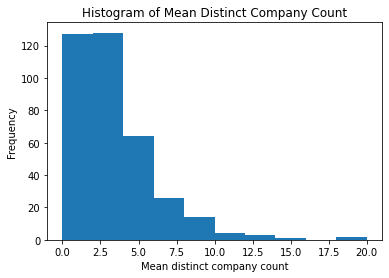

In [0]:
print(f"Stats on {interest_columns[0]}")
get_position_stats(people_company, interest_columns[0])

Stats on Technology
mean: 3.49, std: 2.85, quantiles: [1.0, 5.0], CI for mean: (0.3644979573952535, 0.6162191788058416)


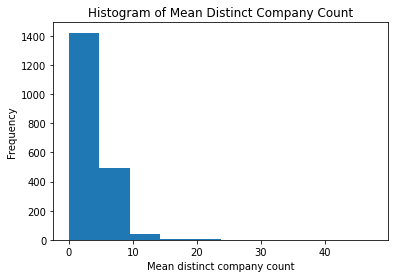

In [0]:
print(f"Stats on {interest_columns[1]}")
get_position_stats(people_company, interest_columns[1])


Stats on Real Estate and Construction
mean: 2.84, std: 2.23, quantiles: [1.0, 4.0], CI for mean: (0.06373575739917582, 0.2478012878919288)


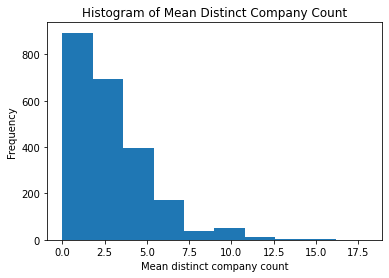

In [0]:
print(f"Stats on {interest_columns[2]}")
get_position_stats(people_company, interest_columns[2])


Stats on Services
mean: 3.17, std: 2.55, quantiles: [1.0, 4.0], CI for mean: (0.10157306462920966, 0.23527903423794783)


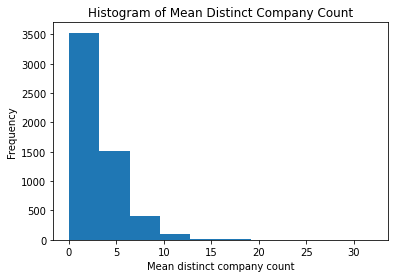

In [0]:
print(f"Stats on {interest_columns[3]}")
get_position_stats(people_company, interest_columns[3])

In [0]:
#EDUCATION

Stats on Financial and Investment
mean: 3.01, std: 3.04, quantiles: [0.0, 4.1875], CI for mean: (-0.3028347074988354, 0.3166611062227141)


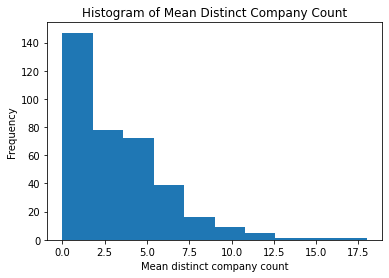

In [0]:
print(f"Stats on {interest_columns[0]}")
get_education_stats(people_company, interest_columns[0])

Stats on Technology
mean: 3.24, std: 3.26, quantiles: [0.0, 5.0], CI for mean: (0.09100669014440688, 0.3791001922510826)


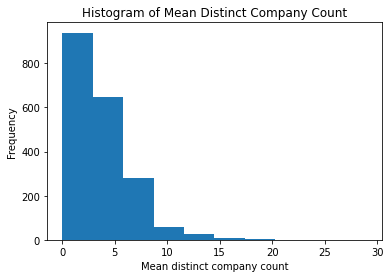

In [0]:
print(f"Stats on {interest_columns[1]}")
get_education_stats(people_company, interest_columns[1])


Stats on Real Estate and Construction
mean: 2.40, std: 3.12, quantiles: [0.0, 4.0], CI for mean: (0.27532038870870523, 0.532661854144912)


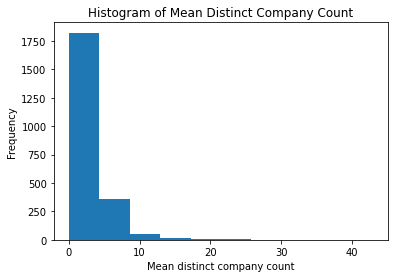

In [0]:
print(f"Stats on {interest_columns[2]}")
get_education_stats(people_company, interest_columns[2])


Stats on Services
mean: 3.12, std: 3.46, quantiles: [0.0, 5.0], CI for mean: (0.028671872297779413, 0.21024593560056953)


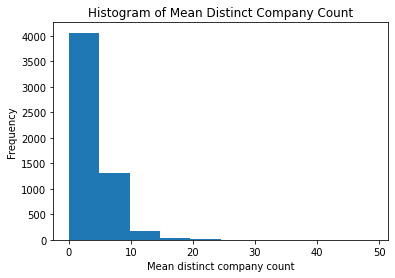

In [0]:
print(f"Stats on {interest_columns[3]}")
get_education_stats(people_company, interest_columns[3])

In [0]:
# LANGUAGES

Stats on Financial and Investment
mean: 1.72, std: 0.87, quantiles: [1.0, 2.0], CI for mean: (0.09902191768373508, 0.4605740419122239)


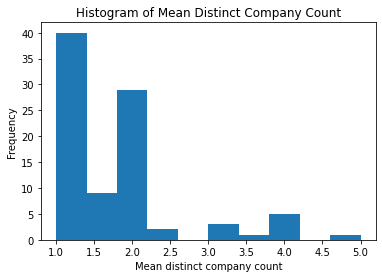

In [0]:
print(f"Stats on {interest_columns[0]}")
get_language_stats(people_company, interest_columns[0])

Stats on Technology
mean: 1.89, std: 0.99, quantiles: [1.0, 2.0], CI for mean: (0.021108258098948285, 0.1891450263540007)


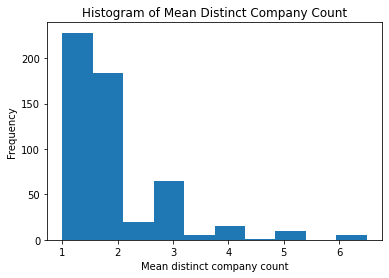

In [0]:
print(f"Stats on {interest_columns[1]}")
get_language_stats(people_company, interest_columns[1])


Stats on Real Estate and Construction
mean: 1.63, std: 0.79, quantiles: [1.0, 2.0], CI for mean: (0.29739798120686434, 0.44908721574272814)


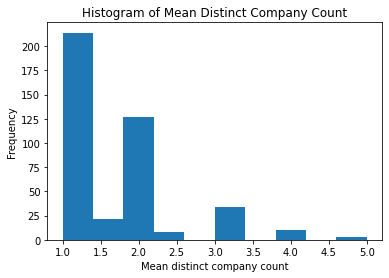

In [0]:
print(f"Stats on {interest_columns[2]}")
get_language_stats(people_company, interest_columns[2])


Stats on Services
mean: 1.79, std: 0.88, quantiles: [1.0, 2.0], CI for mean: (0.16309188726201532, 0.262936938027605)


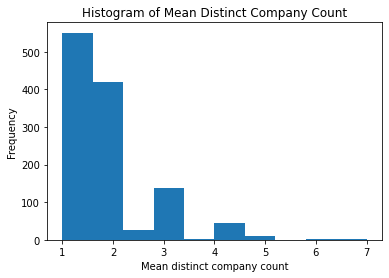

In [0]:
print(f"Stats on {interest_columns[3]}")
get_language_stats(people_company, interest_columns[3])

In [0]:
# Connections

Stats on Financial and Investment
mean: 629.41, std: 1463.27, quantiles: [46.0, 554.0], CI for mean: (-148.89299698047253, 149.71193716427038)


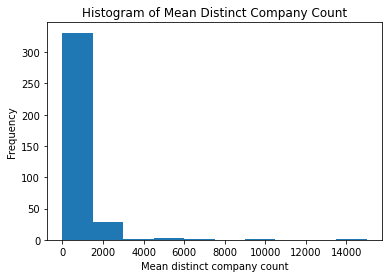

In [0]:
print(f"Stats on {interest_columns[0]}")
get_connections_stats(people_company, interest_columns[0])

Stats on Technology
mean: 560.32, std: 1474.14, quantiles: [50.0, 523.0], CI for mean: (-64.88908466781518, 65.53736647783526)


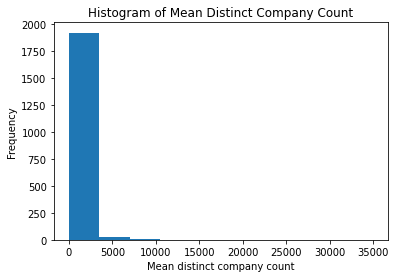

In [0]:
print(f"Stats on {interest_columns[1]}")
get_connections_stats(people_company, interest_columns[1])


Stats on Real Estate and Construction
mean: 337.68, std: 1019.31, quantiles: [19.0, 324.5], CI for mean: (-41.70344746983516, 42.34677976825116)


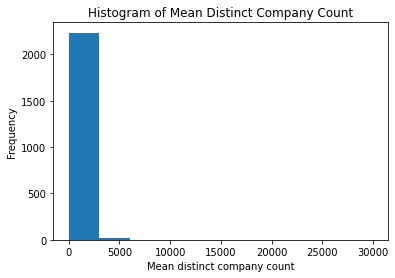

In [0]:
print(f"Stats on {interest_columns[2]}")
get_connections_stats(people_company, interest_columns[2])


Stats on Services
mean: 517.58, std: 7923.39, quantiles: [24.0, 376.0], CI for mean: (-207.27095012196452, 208.1155758617893)


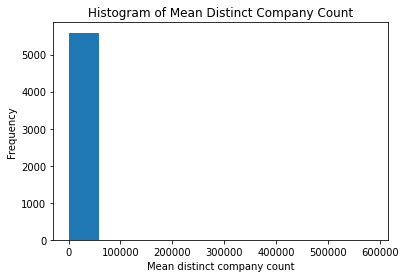

In [0]:
print(f"Stats on {interest_columns[3]}")
get_connections_stats(people_company, interest_columns[3])